In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
from google.colab import drive
import os

model_weights_path_drive = '/content/drive/My Drive/Colab_Notebooks/cae_landscape.pth' # <-- AGGIORNA QUESTO PERCORSO!

# Verifica che il file esista prima di provare a caricarlo
if not os.path.exists(model_weights_path_drive):
    print(f"Errore: Il file dei pesi non è stato trovato al percorso: {model_weights_path_drive}")
    print("Controlla che il percorso sia corretto e che il file sia presente su Google Drive.")
else:
    print(f"File dei pesi trovato: {model_weights_path_drive}")

In [ ]:
import os

folder_path = '/content/drive/My Drive/Colab_Notebooks'

# List the files in the folder
for filename in os.listdir(folder_path):
    print(f"Found file: {filename}")


!unzip -q "/content/drive/My Drive/Colab_Notebooks/landscape_ridotto.zip"

In [ ]:
!pip install pacmap

In [1]:
# evaluate.py
import torch
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
from torch.nn.parameter import Parameter
from torch import nn
from torch.nn import functional as F
import os
import numpy as np
import torchvision
from sklearn.mixture import GaussianMixture
import pacmap
import matplotlib as mpl

In [2]:
img_size = 128
batch_size = 256
learning_rate = 4e-4
latent_dim = 256
n_clusters = 9  # Numero di cluster per il modello CVAE
dataset_path = "./landscape_ridotto/"
model_path = "./VaDE_beta0.1.pth"  # Percorso per salvare il modello
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Seed per la riproducibilità
torch.manual_seed(300)

# ==================================
# 2. CARICAMENTO DATI
# ==================================
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
])

dataset = datasets.ImageFolder(root=dataset_path, transform=transform)
print(f"{len(dataset)} immagini caricate.")

train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)


Using device: cpu
7200 immagini caricate.


In [3]:
# ==================================
# 2. DEFINIZIONE DEL MODELLO (CAE)
#    (Necessaria per caricare i pesi)
# ==================================
class SEBlock(nn.Module):
    def __init__(self, channel, reduction=16):
        super(SEBlock, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1) # 1x1 spatial dimension, necessary for SE block beacause it reduces the feature map to a single value per channel
        self.fc = nn.Sequential(
            nn.Linear(channel, channel // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channel // reduction, channel, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)


class CVADE(nn.Module):
    def __init__(self, latent_dim, img_size, n_clusters):
        super(CVADE, self).__init__()
        self.pi_logits = nn.Parameter(torch.zeros(n_clusters))
        self.mu_prior = Parameter(torch.zeros(n_clusters, latent_dim))
        self.log_var_prior = Parameter(torch.randn(n_clusters, latent_dim))
        self.latent_dim = latent_dim
        self.img_size = img_size

        # Calculate the size after convolutions
        conv_output_size = img_size // 32  # Now 5 Conv layers with stride=2

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=5, stride=2, padding=2),   # (img_size/2)
            nn.BatchNorm2d(64),
            nn.ReLU(),
            SEBlock(64),  # Squeeze-and-Excitation block
            nn.Dropout(p=0.05),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),  # (img_size/4)
            nn.BatchNorm2d(128),
            nn.ReLU(),
            SEBlock(128),  # Squeeze-and-Excitation block
            nn.Dropout(p=0.05),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1), # (img_size/8)
            nn.BatchNorm2d(256),
            nn.ReLU(),
            SEBlock(256),  # Squeeze-and-Excitation block
            nn.Dropout(p=0.05),
            nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1), # (img_size/16)
            nn.BatchNorm2d(512),
            nn.ReLU(),
            SEBlock(512),  # Squeeze-and-Excitation block
            nn.Dropout(p=0.05),
            nn.Conv2d(512, 1024, kernel_size=3, stride=2, padding=1), # (img_size/32)
            nn.BatchNorm2d(1024),
            nn.ReLU(),
            SEBlock(1024),  # Squeeze-and-Excitation block
            nn.Flatten()
        )
        self.fc_mu = nn.Linear(1024 * conv_output_size * conv_output_size, latent_dim)
        self.fc_logvar = nn.Linear(1024 * conv_output_size * conv_output_size, latent_dim)

        # Decoder
        self.fc_decode = nn.Linear(latent_dim, 1024 * conv_output_size * conv_output_size)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(1024, 512, kernel_size=3, stride=2, padding=1, output_padding=1),  # (img_size/16)
            nn.BatchNorm2d(512),
            nn.ReLU(),
            SEBlock(512),  # Squeeze-and-Excitation block
            nn.Dropout(p=0.05),
            nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, output_padding=1),   # (img_size/8)
            nn.BatchNorm2d(256),
            nn.ReLU(),
            SEBlock(256),  # Squeeze-and-Excitation block
            nn.Dropout(p=0.05),
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),   # (img_size/4)
            nn.BatchNorm2d(128),
            nn.ReLU(),
            SEBlock(128),  # Squeeze-and-Excitation block
            nn.Dropout(p=0.05),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),    # (img_size/2)
            nn.BatchNorm2d(64),
            nn.ReLU(),
            SEBlock(64),  # Squeeze-and-Excitation block
            nn.Dropout(p=0.05),
            nn.ConvTranspose2d(64, 3, kernel_size=5, stride=2, padding=2, output_padding=1),      # (img_size)
            nn.Sigmoid()
        )

    def encode(self, x):
        h = self.encoder(x)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        h = self.fc_decode(z)
        conv_output_size = self.img_size // 32
        h = h.view(-1, 1024, conv_output_size, conv_output_size)
        return self.decoder(h)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar

In [4]:
# ==================================
# 3. CARICAMENTO MODELLO E DATI
# ==================================
# Carica il modello addestrato
model = CVADE(latent_dim=latent_dim, img_size=img_size, n_clusters=n_clusters).to(device)
try:
    model.load_state_dict(torch.load(model_path, map_location=device))
except FileNotFoundError:
    print(f"Errore: File del modello non trovato in '{model_path}'. Esegui prima train.py.")
    exit()

model.eval()
print("Modello addestrato caricato con successo.")

# Carica i dati per la valutazione
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
])
dataset = datasets.ImageFolder(root=dataset_path, transform=transform)
eval_loader = DataLoader(dataset, batch_size=64, shuffle=False)


Modello addestrato caricato con successo.


In [5]:
# ==================================
# 4. ESTRAZIONE SPAZIO LATENTE
# ==================================
all_images = []
all_labels = []
reconstructed_images = []
latent_vectors = []

print("Codifica del dataset nello spazio latente...")
with torch.no_grad():
    for images, labels in eval_loader:
        images = images.to(device)
        all_images.append(images)
        all_labels.append(labels)
        reconstructed, mu, logvar = model(images)
        reconstructed_images.append(reconstructed.cpu())
        latent_mu, _ = model.encode(images)
        latent_vectors.append(latent_mu.cpu())
        print(f"Batch elaborato: {len(all_images)} batch")
latent_vectors = torch.cat(latent_vectors).numpy()
all_images = torch.cat(all_images, dim=0) # dim=0 per concatenare lungo il batch
all_labels = torch.cat(all_labels, dim=0)
reconstructed_images = torch.cat(reconstructed_images, dim=0)

print(f"Spazio latente estratto. Shape: {latent_vectors.shape}")


Codifica del dataset nello spazio latente...
Batch elaborato: 1 batch
Batch elaborato: 2 batch
Batch elaborato: 3 batch
Batch elaborato: 4 batch
Batch elaborato: 5 batch
Batch elaborato: 6 batch
Batch elaborato: 7 batch
Batch elaborato: 8 batch
Batch elaborato: 9 batch
Batch elaborato: 10 batch
Batch elaborato: 11 batch
Batch elaborato: 12 batch
Batch elaborato: 13 batch
Batch elaborato: 14 batch
Batch elaborato: 15 batch
Batch elaborato: 16 batch
Batch elaborato: 17 batch
Batch elaborato: 18 batch
Batch elaborato: 19 batch
Batch elaborato: 20 batch
Batch elaborato: 21 batch
Batch elaborato: 22 batch
Batch elaborato: 23 batch
Batch elaborato: 24 batch
Batch elaborato: 25 batch
Batch elaborato: 26 batch
Batch elaborato: 27 batch
Batch elaborato: 28 batch
Batch elaborato: 29 batch
Batch elaborato: 30 batch
Batch elaborato: 31 batch
Batch elaborato: 32 batch
Batch elaborato: 33 batch
Batch elaborato: 34 batch
Batch elaborato: 35 batch
Batch elaborato: 36 batch
Batch elaborato: 37 batch
Ba

In [6]:
print(all_labels.shape)
print(len(all_labels))
print(len(latent_vectors))
print("Numero di label differenti:", all_labels.unique().numel())
print("Valori unici delle label:", all_labels.unique().tolist())
print(len(reconstructed_images))

torch.Size([7200])
7200
7200
Numero di label differenti: 9
Valori unici delle label: [0, 1, 2, 3, 4, 5, 6, 7, 8]
7200


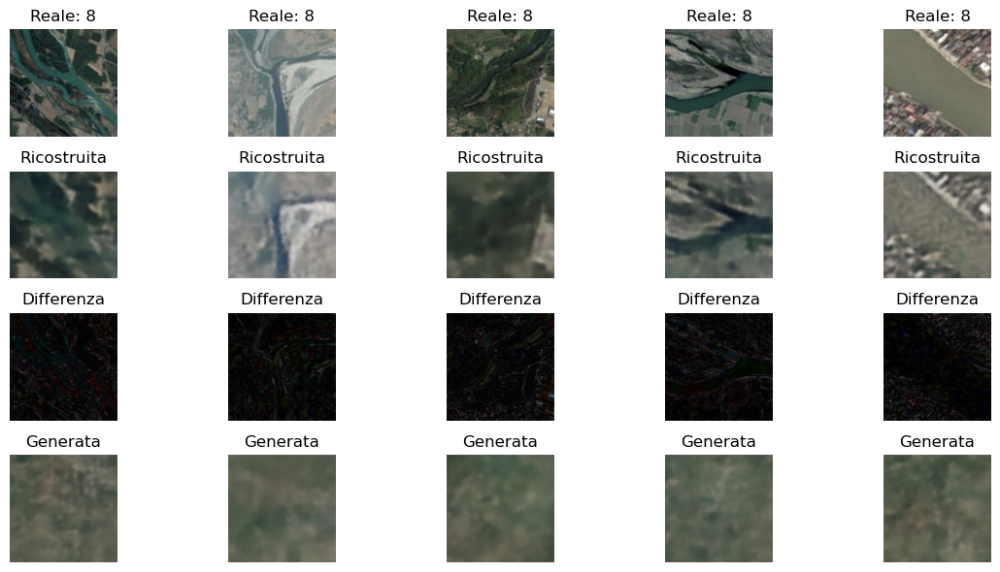

In [7]:
start_index = 7000  # Cambia questo valore per vedere altre immagini (es. 0, 5, 10, ...)

# Seleziona alcune immagini reali dal dataset di valutazione
n_examples = 5
real_images = all_images[start_index:start_index + n_examples]
real_labels = all_labels[start_index:start_index + n_examples]

# Oppure, per selezionare immagini casuali:
# indices = torch.randperm(len(all_images))[:n_examples]
# real_images = all_images[indices]
# real_labels = all_labels[indices]

# Ricostruisci le immagini con il modello
model.eval()
with torch.no_grad():
    reconstructed_examples = model(real_images.to(device))[0].cpu()
    generated_examples = model.decode(torch.randn(n_examples, latent_dim).to(device)).cpu()

# Visualizza immagini reali, ricostruite e la differenza
fig, axes = plt.subplots(4, n_examples, figsize=(12, 6))
for i in range(n_examples):
    # Immagini reali
    axes[0, i].imshow(real_images[i].permute(1, 2, 0))
    axes[0, i].set_title(f"Reale: {real_labels[i].item()}")
    axes[0, i].axis("off")

    # Immagini ricostruite
    axes[1, i].imshow(reconstructed_examples[i].permute(1, 2, 0))
    axes[1, i].set_title("Ricostruita")
    axes[1, i].axis("off")

    # Differenza
    diff = (real_images[i] - reconstructed_examples[i]).abs() #abs() per ottenere la differenza assoluta
    axes[2, i].imshow(diff.permute(1, 2, 0))
    axes[2, i].set_title("Differenza")
    axes[2, i].axis("off")

    # Immagini generate (dallo spazio latente casuale)
    axes[3, i].imshow(generated_examples[i].permute(1, 2, 0))
    axes[3, i].set_title("Generata")
    axes[3, i].axis("off")

plt.tight_layout()
plt.show()

Riduzione della dimensionalità con PaCMAP...


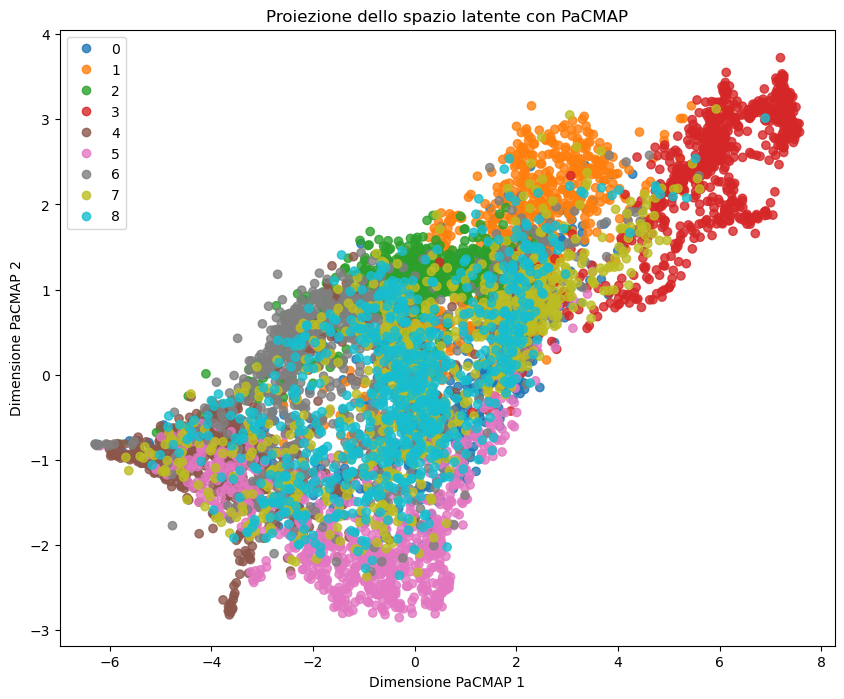

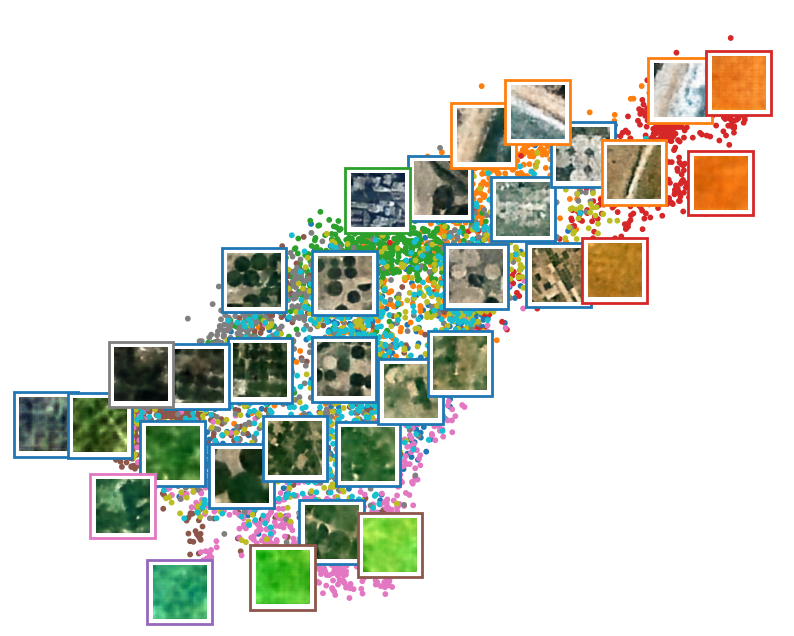

In [8]:
# ==================================
# 5. DIMENSIONALITY REDUCTION E VISUALIZZAZIONE
# ==================================

# Visualizzazione con PaCMAP
print("Riduzione della dimensionalità con PaCMAP...")
pacmap_model = pacmap.PaCMAP(MN_ratio=2, FP_ratio=0.5)
reduced_data = pacmap_model.fit_transform(latent_vectors)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=all_labels, cmap='tab10', alpha=0.8)
plt.title("Proiezione dello spazio latente con PaCMAP")
plt.xlabel("Dimensione PaCMAP 1")
plt.ylabel("Dimensione PaCMAP 2")
plt.legend(handles=scatter.legend_elements()[0], labels=range(n_clusters))
#plt.savefig(os.path.join(output_dir, "pacmap_clusters.png"))
plt.show()

# Visualizziamo le immagini proiettate nello spazio PaCMAP
plt.figure(figsize=(10, 8))
cmap = plt.cm.tab10
plt.scatter(reduced_data[:, 0], reduced_data[:, 1],
            c=all_labels, s=10, cmap=cmap)
image_positions = np.array([[1., 1.]])


for index, position in enumerate(reduced_data):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 1:  # Se abbastanza lontano da altre immagini
        image_positions = np.r_[image_positions, [position]]

        # Converti l'immagine nel formato corretto (H, W, 3)
        img = reconstructed_images[index].permute(1, 2, 0).cpu().numpy()  # Estraggo l'immagine
        img = (img - img.min()) / (img.max() -
                                   img.min())  # Normalizza tra 0 e 1

        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(img, zoom=0.3),  # Rimpicciolisci l'immagine
            position, bboxprops={"edgecolor": cmap(all_labels[index]), "lw": 2})
        plt.gca().add_artist(imagebox)

plt.axis("off")
plt.show()

In [9]:
from sklearn.metrics import adjusted_rand_score, homogeneity_score, completeness_score, v_measure_score
from scipy.optimize import linear_sum_assignment

import torch
import numpy as np
from torch.distributions.multivariate_normal import MultivariateNormal

import torch
import numpy as np


def compute_gamma(z, pi_prior, mu_prior, log_var_prior):
    """
    Calcola le responsabilità gamma (q(c|x)) in modo numericamente stabile.
    Questa è l'implementazione dell'Equazione 10 del paper VaDE.
    Usa operazioni in log-space per evitare underflow/overflow.

    Args:
        z (torch.Tensor): Vettori latenti campionati dalla q(z|x), dimensione (batch_size, latent_dim).
        pi_prior (torch.Tensor): Pesi dei cluster (prior p(c)), dimensione (n_clusters,).
        mu_prior (torch.Tensor): Medie dei cluster (prior p(z|c)), dimensione (n_clusters, latent_dim).
        log_var_prior (torch.Tensor): Log-varianze dei cluster (prior p(z|c)), dimensione (n_clusters, latent_dim).

    Returns:
        torch.Tensor: Le responsabilità gamma, dimensione (batch_size, n_clusters).
    """
    # 1. Espandi le dimensioni dei tensori per il broadcasting corretto
    #    z diventa [batch_size, 1, latent_dim]
    #    i prior diventano [1, n_clusters, latent_dim]
    z_expanded = z.unsqueeze(1)  # z diventa [batch_size, 1, latent_dim]
    # mu_prior diventa [1, n_clusters, latent_dim]
    mu_prior_expanded = mu_prior.unsqueeze(0)
    # log_var_prior diventa [1, n_clusters, latent_dim]
    log_var_prior_expanded = log_var_prior.unsqueeze(0)

    # 2. Calcola il logaritmo della densità di probabilità Gaussiana: log p(z|c)
    #    La formula è -0.5 * [d*log(2π) + log_var + (z-mu)²/var]
    #    Ignoriamo la costante log(2π) perché si annulla nel passaggio successivo (softmax).
    log_p_z_given_c = -0.5 * torch.sum(
        log_var_prior_expanded +
        (z_expanded - mu_prior_expanded).pow(2) /
        torch.exp(log_var_prior_expanded),
        dim=2  # Somma sulla dimensione latente per ottenere un valore per ogni cluster
    )

    # 3. Calcola il numeratore della formula di Bayes in log-space:
    #    log( p(c) * p(z|c) ) = log(p(c)) + log(p(z|c))
    #    Aggiungiamo una piccola costante (epsilon) a pi_prior per evitare log(0).
    log_gamma_unnormalized = torch.log(
        pi_prior.unsqueeze(0) + 1e-10) + log_p_z_given_c

    # 4. Normalizza usando softmax per ottenere le probabilità finali (gamma).
    #    torch.softmax calcola in modo sicuro: exp(x) / sum(exp(x))
    #    È il modo robusto per convertire i logaritmi delle probabilità in probabilità reali.
    gamma = torch.softmax(log_gamma_unnormalized, dim=1)

    return gamma


def predict_clusters(model, dataloader, device):
    """
    Estrae le predizioni dei cluster usando la logica VaDE aggiornata.

    Args:
        model (nn.Module): Il modello VaDE addestrato con i logits.
        dataloader (DataLoader): Il dataloader con i dati di test/valutazione.
        device (torch.device): Il device su cui eseguire i calcoli ('cuda' o 'cpu').
        n_clusters (int): Il numero di cluster.

    Returns:
        tuple: Una tupla contenente (etichette_predette, etichette_reali) come array NumPy.
    """
    # Imposta il modello in modalità di valutazione
    model.eval()
    
    # 1. Recupera i parametri del GMM, inclusi i LOGITS, e staccali dal grafo
    pi_logits = model.pi_logits.clone().detach()
    mu_prior = model.mu_prior.clone().detach()
    log_var_prior = model.log_var_prior.clone().detach()
    
    # 2. Calcola le probabilità pi dai logits, operazione da fare una sola volta
    pi = torch.softmax(pi_logits, dim=0)

    all_predicted_labels = []
    all_true_labels = []

    # Disabilita il calcolo dei gradienti per l'inferenza
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            
            # Ottieni la rappresentazione latente (usiamo la media 'mu')
            # Assumendo che il tuo modello abbia un metodo 'encode' o simile
            # che restituisca mu e log_var
            z_mu, _ = model.encode(images)

            # 3. (OTTIMIZZAZIONE) Riusa la funzione `compute_gamma` per calcolare
            #    le probabilità posteriori p(c|z) in modo efficiente e vettorizzato.
            gamma = compute_gamma(z_mu, pi, mu_prior, log_var_prior)

            # 4. Assegna ogni punto al cluster con la massima probabilità posteriore
            predicted_labels = torch.argmax(gamma, dim=1)
            
            all_predicted_labels.append(predicted_labels.cpu().numpy())
            all_true_labels.append(labels.cpu().numpy())

    # Concatena i risultati di tutti i batch
    final_predicted_labels = np.concatenate(all_predicted_labels)
    final_true_labels = np.concatenate(all_true_labels)
    
    return final_predicted_labels, final_true_labels


print("Estrazione dei cluster usando il GMM interno del modello...")
cluster_labels, all_labels = predict_clusters(model, eval_loader, device)
print("Estrazione completata.")

# Adjusted Rand Index
ari = adjusted_rand_score(all_labels, cluster_labels)
print(f"Adjusted Rand Index: {ari:.3f}")

# Funzione per l'accuratezza (la tua versione moderna è perfetta)
def cluster_accuracy(y_true, y_pred):
    D = max(y_pred.max(), y_true.max()) + 1
    cost_matrix = np.zeros((D, D), dtype=int)
    for i in range(y_pred.size):
        cost_matrix[y_pred[i], y_true[i]] += 1
    row_ind, col_ind = linear_sum_assignment(cost_matrix.max() - cost_matrix)
    return cost_matrix[row_ind, col_ind].sum() / y_pred.size

# Clustering Accuracy
acc = cluster_accuracy(all_labels, cluster_labels)
print(f"Clustering accuracy: {acc:.3f}")

# Altre metriche
h = homogeneity_score(all_labels, cluster_labels)
c = completeness_score(all_labels, cluster_labels)
v = v_measure_score(all_labels, cluster_labels)
print(f"Homogeneity: {h:.3f}, Completeness: {c:.3f}, V-measure: {v:.3f}")

Estrazione dei cluster usando il GMM interno del modello...
Estrazione completata.
Adjusted Rand Index: 0.186
Clustering accuracy: 0.404
Homogeneity: 0.301, Completeness: 0.322, V-measure: 0.311


Riduzione della dimensionalità con PaCMAP...


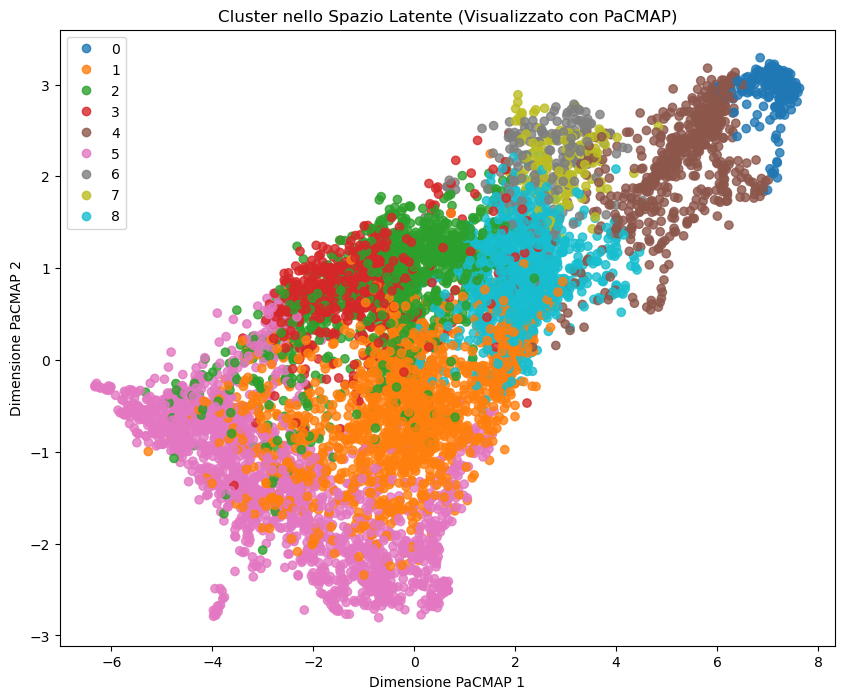

In [10]:
# Clustering con Gaussian Mixture Model
gmm = GaussianMixture(n_components=n_clusters, random_state=42, )
cluster_labels = gmm.fit_predict(latent_vectors)

# Visualizzazione con PaCMAP
print("Riduzione della dimensionalità con PaCMAP...")
pacmap_model = pacmap.PaCMAP(MN_ratio=2, FP_ratio=0.5)
reduced_data = pacmap_model.fit_transform(latent_vectors)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=cluster_labels, cmap='tab10', alpha=0.8)
plt.title("Cluster nello Spazio Latente (Visualizzato con PaCMAP)")
plt.xlabel("Dimensione PaCMAP 1")
plt.ylabel("Dimensione PaCMAP 2")
plt.legend(handles=scatter.legend_elements()[0], labels=range(n_clusters))
#plt.savefig(os.path.join(output_dir, "pacmap_clusters.png"))
plt.show()

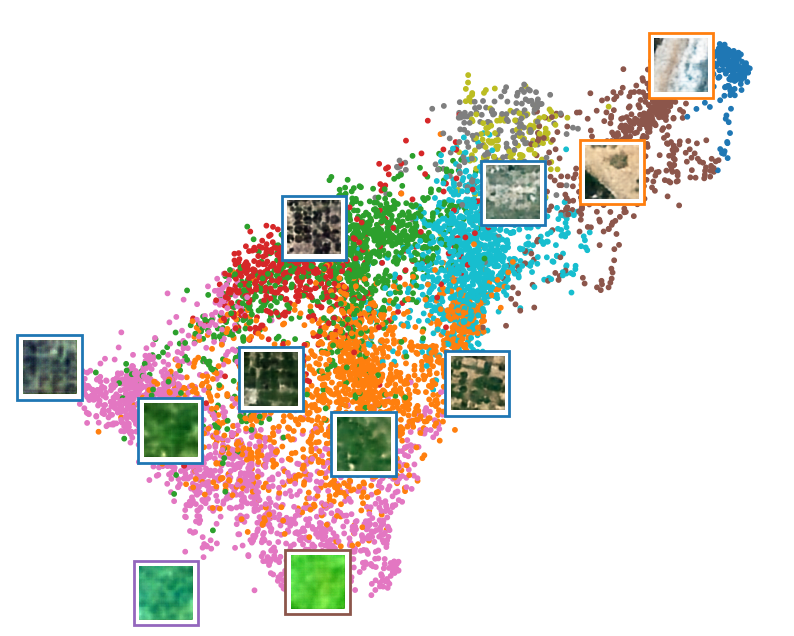

In [11]:
# Visualizziamo le immagini proiettate nello spazio PaCMAP
plt.figure(figsize=(10, 8))
cmap = plt.cm.tab10
plt.scatter(reduced_data[:, 0], reduced_data[:, 1],
            c=cluster_labels, s=10, cmap=cmap)
image_positions = np.array([[1., 1.]])


for index, position in enumerate(reduced_data):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 3:  # Se abbastanza lontano da altre immagini
        image_positions = np.r_[image_positions, [position]]

        # Converti l'immagine nel formato corretto (H, W, 3)
        img = reconstructed_images[index].permute(1, 2, 0).cpu().numpy()  # Estraggo l'immagine
        img = (img - img.min()) / (img.max() -
                                   img.min())  # Normalizza tra 0 e 1

        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(img, zoom=0.3),  # Rimpicciolisci l'immagine
            position, bboxprops={"edgecolor": cmap(all_labels[index]), "lw": 2})
        plt.gca().add_artist(imagebox)

plt.axis("off")
plt.show()


Visualizzazione di immagini reali e ricostruite per ogni cluster:


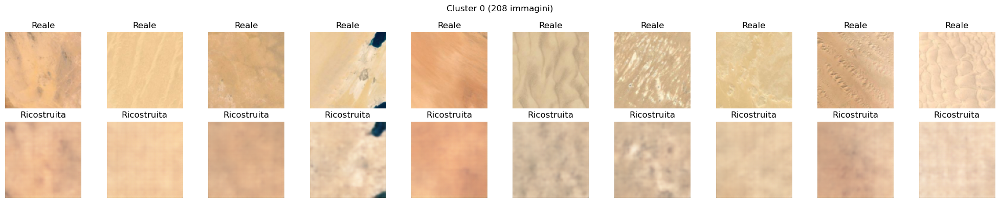

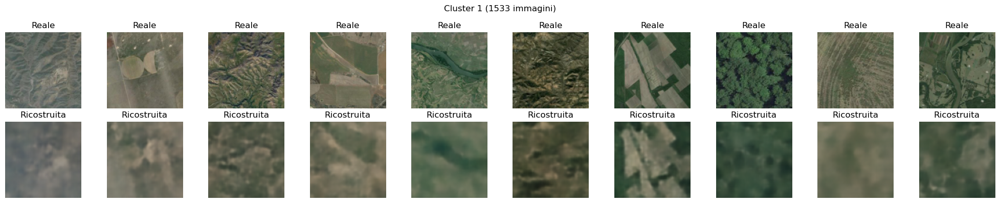

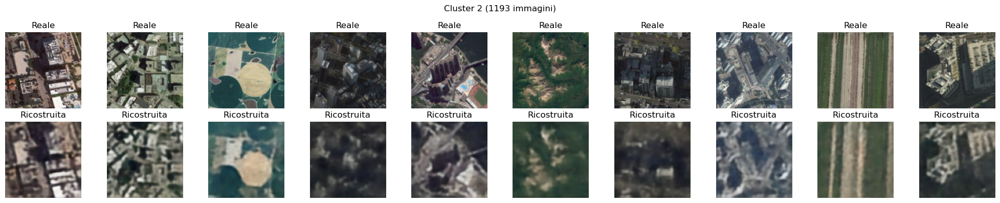

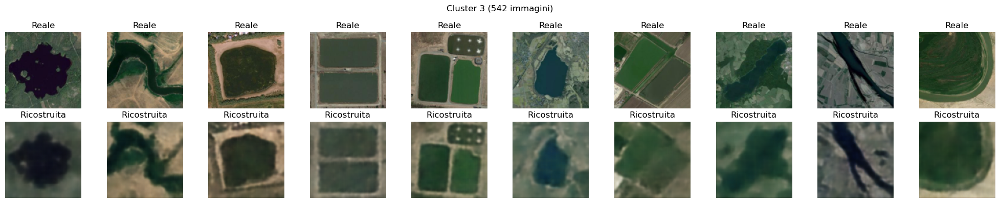

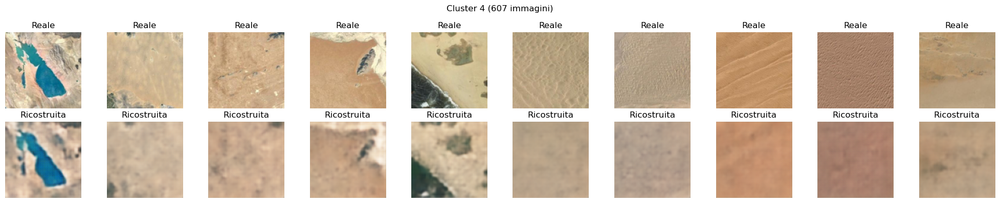

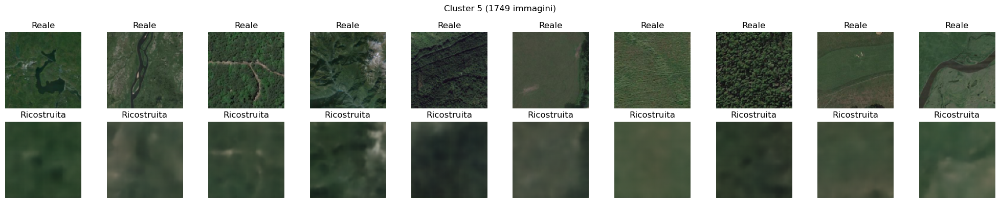

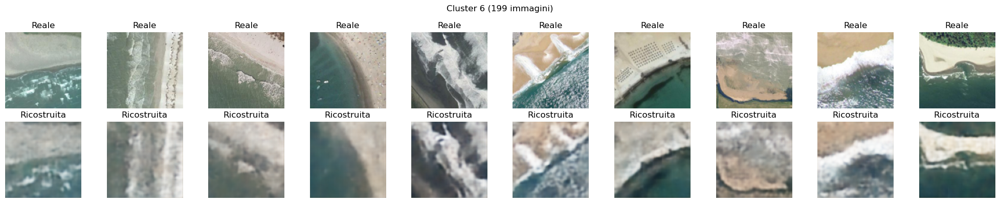

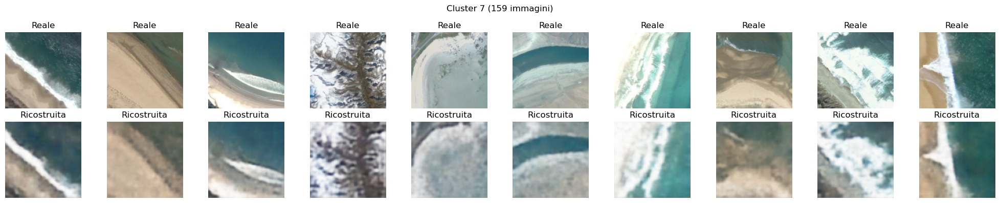

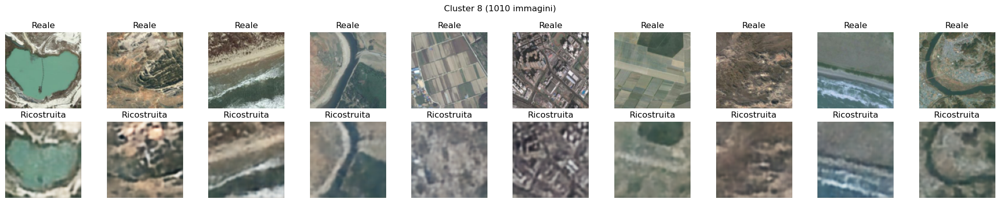

In [12]:
# ==================================
# 6. VISUALIZZAZIONE IMMAGINI PER CLUSTER
# ==================================
def visualize_images_by_cluster(real_images, reconstructed_images, labels, n_clusters, n_examples):
    print("\nVisualizzazione di immagini reali e ricostruite per ogni cluster:")
    for cluster_id in range(n_clusters):
        indices = np.where(labels == cluster_id)[0]
        if len(indices) == 0:
            print(f"Cluster {cluster_id}: 0 immagini")
            continue

        selected_indices = np.random.choice(indices, size=min(n_examples, len(indices)), replace=False)

        fig, axes = plt.subplots(2, len(selected_indices), figsize=(len(selected_indices) * 2, 4))
        if len(selected_indices) == 1:
            axes = np.expand_dims(axes, axis=1)  # Rende axes sempre 2D

        for i, idx in enumerate(selected_indices):
            # Immagine reale
            img_real = real_images[idx].permute(1, 2, 0).cpu().numpy()
            axes[0, i].imshow(img_real)
            axes[0, i].set_title("Reale")
            axes[0, i].axis("off")

            # Immagine ricostruita
            img_rec = reconstructed_images[idx].permute(1, 2, 0).cpu().numpy()
            axes[1, i].imshow(img_rec)
            axes[1, i].set_title("Ricostruita")
            axes[1, i].axis("off")

        fig.suptitle(f"Cluster {cluster_id} ({len(indices)} immagini)")
        plt.tight_layout()
        #plt.savefig(os.path.join(output_dir, f"real_reconstructed_images_cluster_{cluster_id}.png"))
        plt.show()

visualize_images_by_cluster(all_images, reconstructed_images, cluster_labels, n_clusters=n_clusters, n_examples=10)

In [19]:
# ==================================
# 7. CONFRONTO TRA LABEL REALI E CLUSTERING GMM
# ==================================

from sklearn.metrics import adjusted_rand_score

ari = adjusted_rand_score(all_labels, cluster_labels)
print(f"Adjusted Rand Index: {ari:.3f}")

from scipy.optimize import linear_sum_assignment
import numpy as np

def cluster_accuracy(y_true, y_pred):
    # Trova la migliore corrispondenza tra cluster e label reali
    D = max(y_pred.max(), y_true.max()) + 1
    cost_matrix = np.zeros((D, D), dtype=int)
    for i in range(y_pred.size):
        cost_matrix[y_pred[i], y_true[i]] += 1
    row_ind, col_ind = linear_sum_assignment(cost_matrix.max() - cost_matrix)
    return cost_matrix[row_ind, col_ind].sum() / y_pred.size

acc = cluster_accuracy(all_labels, cluster_labels)
print(f"Clustering accuracy: {acc:.3f}")


from sklearn.metrics import homogeneity_score, completeness_score, v_measure_score

h = homogeneity_score(all_labels, cluster_labels)
c = completeness_score(all_labels, cluster_labels)
v = v_measure_score(all_labels, cluster_labels)
print(f"Homogeneity: {h:.3f}, Completeness: {c:.3f}, V-measure: {v:.3f}")

Adjusted Rand Index: 0.232
Clustering accuracy: 0.406
Homogeneity: 0.330, Completeness: 0.374, V-measure: 0.351


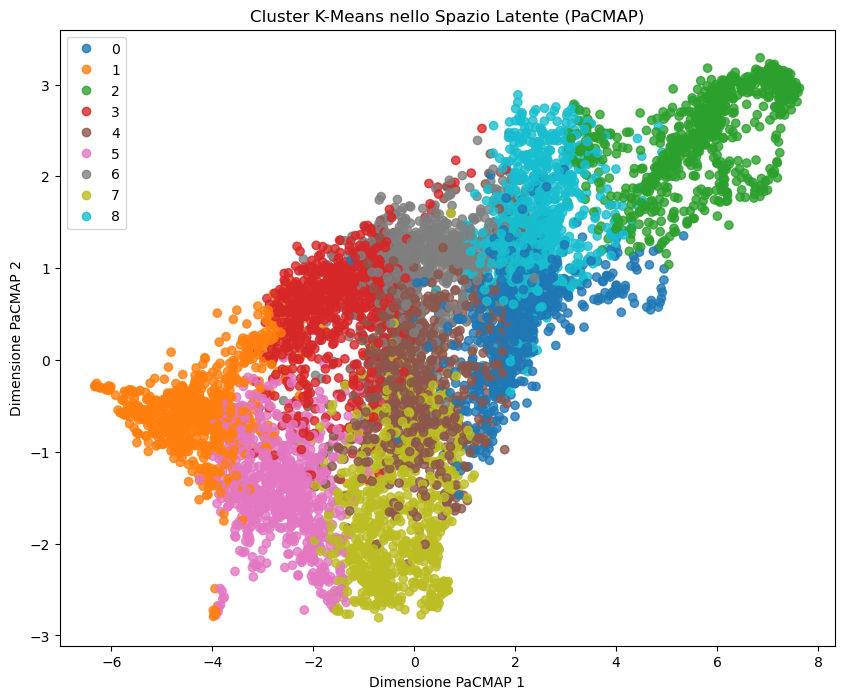

Adjusted Rand Index: 0.232
Clustering accuracy: 0.406
Homogeneity: 0.324, Completeness: 0.324, V-measure: 0.324


In [13]:
from k_means_constrained import KMeansConstrained

# Imposta il numero di elementi per cluster
elements_per_cluster = len(latent_vectors) // n_clusters

# Esegui il clustering K-Means bilanciato sullo spazio latente
kmeans = KMeansConstrained(
    n_clusters=n_clusters,
    size_min=elements_per_cluster,
    size_max=elements_per_cluster,
    random_state=42
)
kmeans_labels = kmeans.fit_predict(latent_vectors)

# Visualizza i cluster trovati da K-Means nello spazio PaCMAP
plt.figure(figsize=(10, 8))
scatter_kmeans = plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=kmeans_labels, cmap='tab10', alpha=0.8)
plt.title("Cluster K-Means nello Spazio Latente (PaCMAP)")
plt.xlabel("Dimensione PaCMAP 1")
plt.ylabel("Dimensione PaCMAP 2")
plt.legend(handles=scatter_kmeans.legend_elements()[0], labels=range(n_clusters))
plt.show()

# ==================================
# 7. CONFRONTO TRA LABEL REALI E CLUSTERING GMM
# ==================================

from sklearn.metrics import adjusted_rand_score

ari = adjusted_rand_score(all_labels, cluster_labels)
print(f"Adjusted Rand Index: {ari:.3f}")

from scipy.optimize import linear_sum_assignment
import numpy as np

def cluster_accuracy(y_true, y_pred):
    # Trova la migliore corrispondenza tra cluster e label reali
    D = max(y_pred.max(), y_true.max()) + 1
    cost_matrix = np.zeros((D, D), dtype=int)
    for i in range(y_pred.size):
        cost_matrix[y_pred[i], y_true[i]] += 1
    row_ind, col_ind = linear_sum_assignment(cost_matrix.max() - cost_matrix)
    return cost_matrix[row_ind, col_ind].sum() / y_pred.size

acc = cluster_accuracy(all_labels, cluster_labels)
print(f"Clustering accuracy: {acc:.3f}")


from sklearn.metrics import homogeneity_score, completeness_score, v_measure_score

h = homogeneity_score(all_labels, kmeans_labels)
c = completeness_score(all_labels, kmeans_labels)
v = v_measure_score(all_labels, kmeans_labels)
print(f"Homogeneity: {h:.3f}, Completeness: {c:.3f}, V-measure: {v:.3f}")


Visualizzazione di immagini reali e ricostruite per ogni cluster:


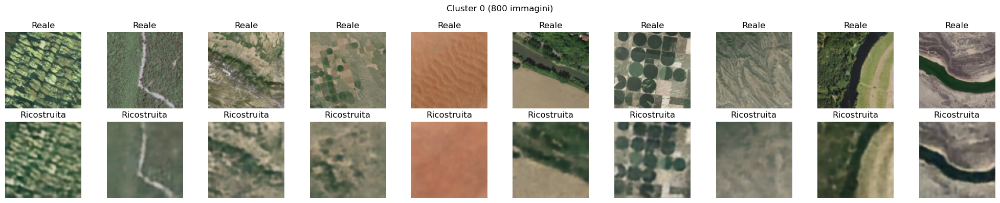

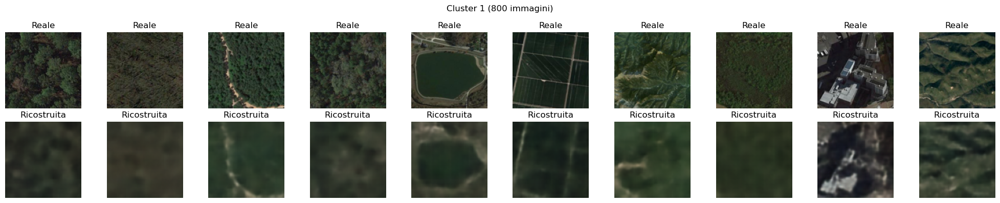

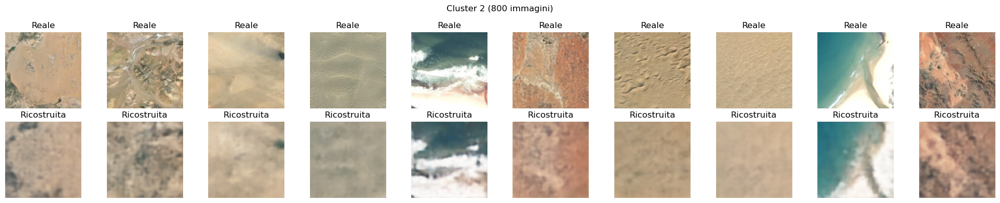

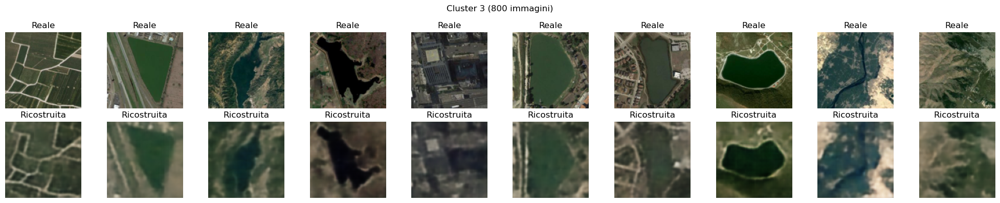

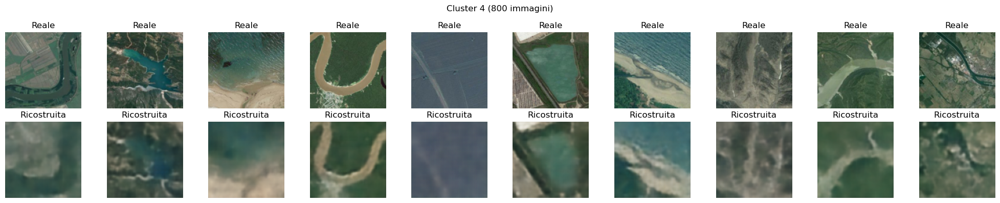

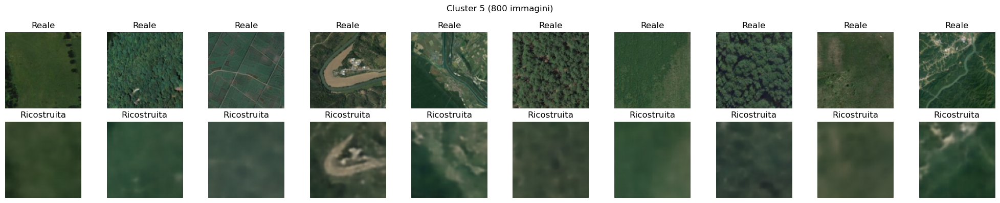

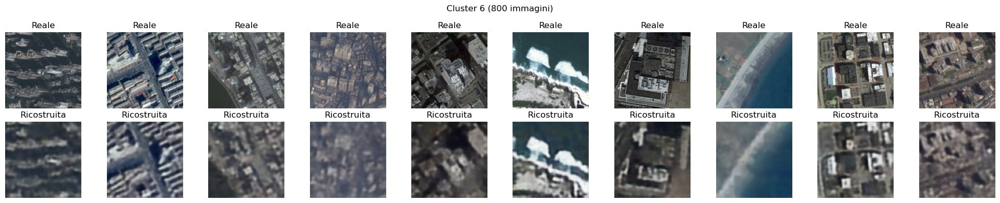

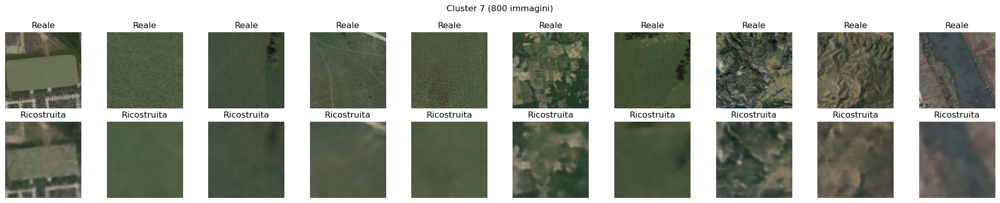

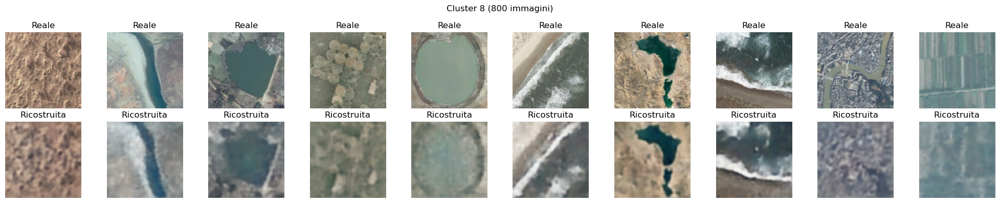

In [14]:
# ==================================
# 6. VISUALIZZAZIONE IMMAGINI PER CLUSTER
# ==================================
def visualize_images_by_cluster(real_images, reconstructed_images, labels, n_clusters, n_examples):
    print("\nVisualizzazione di immagini reali e ricostruite per ogni cluster:")
    for cluster_id in range(n_clusters):
        indices = np.where(labels == cluster_id)[0]
        if len(indices) == 0:
            print(f"Cluster {cluster_id}: 0 immagini")
            continue

        selected_indices = np.random.choice(indices, size=min(n_examples, len(indices)), replace=False)

        fig, axes = plt.subplots(2, len(selected_indices), figsize=(len(selected_indices) * 2, 4))
        if len(selected_indices) == 1:
            axes = np.expand_dims(axes, axis=1)  # Rende axes sempre 2D

        for i, idx in enumerate(selected_indices):
            # Immagine reale
            img_real = real_images[idx].permute(1, 2, 0).cpu().numpy()
            axes[0, i].imshow(img_real)
            axes[0, i].set_title("Reale")
            axes[0, i].axis("off")

            # Immagine ricostruita
            img_rec = reconstructed_images[idx].permute(1, 2, 0).cpu().numpy()
            axes[1, i].imshow(img_rec)
            axes[1, i].set_title("Ricostruita")
            axes[1, i].axis("off")

        fig.suptitle(f"Cluster {cluster_id} ({len(indices)} immagini)")
        plt.tight_layout()
        #plt.savefig(os.path.join(output_dir, f"real_reconstructed_images_cluster_{cluster_id}.png"))
        plt.show()

visualize_images_by_cluster(all_images, reconstructed_images, kmeans_labels, n_clusters=n_clusters, n_examples=10)

In [ ]:
# ==================================
# 8. CLASSIFICAZIONE SULLO SPAZIO LATENTE CON MLP
# ==================================

import torch.nn as nn
import torch.optim as optim

# Definizione di un semplice MLP per classificazione
class LatentMLP(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(LatentMLP, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, num_classes)
        )

    def forward(self, x):
        return self.net(x)

# Prepara dati e label
X = torch.tensor(latent_vectors, dtype=torch.float32)
y = torch.tensor(all_labels)

# Divisione in training e validation set
from torch.utils.data import TensorDataset, DataLoader, random_split

dataset = TensorDataset(X, y)
val_ratio = 0.2
val_size = int(len(dataset) * val_ratio)
train_size = len(dataset) - val_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Parametri
input_dim = X.shape[1]
num_classes = int(all_labels.max().item()) + 1
mlp = LatentMLP(input_dim, num_classes).to(device)

# Loss e ottimizzatore
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(mlp.parameters(), lr=1e-3)

# Training loop con validazione
epochs = 200
for epoch in range(epochs):
    mlp.train()
    train_loss = 0
    train_correct = 0
    train_total = 0
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        outputs = mlp(xb)
        loss = criterion(outputs, yb)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * xb.size(0)
        _, preds = torch.max(outputs, 1)
        train_correct += (preds == yb).sum().item()
        train_total += xb.size(0)
    train_acc = train_correct / train_total
    train_loss /= train_total

    # Validation
    mlp.eval()
    val_loss = 0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for xb, yb in val_loader:
            xb, yb = xb.to(device), yb.to(device)
            outputs = mlp(xb)
            loss = criterion(outputs, yb)
            val_loss += loss.item() * xb.size(0)
            _, preds = torch.max(outputs, 1)
            val_correct += (preds == yb).sum().item()
            val_total += xb.size(0)
    val_acc = val_correct / val_total
    val_loss /= val_total

    if (epoch+1) % 5 == 0:
        print(f"Epoch {epoch+1}/{epochs} - Train Loss: {train_loss:.4f} - Train Acc: {train_acc:.4f} - Val Loss: {val_loss:.4f} - Val Acc: {val_acc:.4f}")

Epoch 5/200 - Train Loss: 0.5340 - Train Acc: 0.8142 - Val Loss: 0.8778 - Val Acc: 0.6965
Epoch 10/200 - Train Loss: 0.1734 - Train Acc: 0.9510 - Val Loss: 1.2093 - Val Acc: 0.6958
Epoch 15/200 - Train Loss: 0.0396 - Train Acc: 0.9922 - Val Loss: 1.6521 - Val Acc: 0.6917
Epoch 20/200 - Train Loss: 0.0137 - Train Acc: 0.9981 - Val Loss: 1.9197 - Val Acc: 0.6903
Epoch 25/200 - Train Loss: 0.0050 - Train Acc: 0.9991 - Val Loss: 2.1230 - Val Acc: 0.6917
Epoch 30/200 - Train Loss: 0.0022 - Train Acc: 0.9998 - Val Loss: 2.2691 - Val Acc: 0.6889
Epoch 35/200 - Train Loss: 0.3985 - Train Acc: 0.8752 - Val Loss: 1.3643 - Val Acc: 0.6653
Epoch 40/200 - Train Loss: 0.0040 - Train Acc: 0.9998 - Val Loss: 1.9119 - Val Acc: 0.6799
Epoch 45/200 - Train Loss: 0.0014 - Train Acc: 1.0000 - Val Loss: 2.1012 - Val Acc: 0.6813
Epoch 50/200 - Train Loss: 0.0008 - Train Acc: 1.0000 - Val Loss: 2.2208 - Val Acc: 0.6861
Epoch 55/200 - Train Loss: 0.0006 - Train Acc: 1.0000 - Val Loss: 2.3101 - Val Acc: 0.6840


In [17]:
# ==================================
# 9. VALUTAZIONE DELLA SVM SULLO SPAZIO LATENTE
# ==================================

from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split

# Prepara i dati (usa X e y già definiti)

X_np = X.cpu().numpy()
y_np = y.cpu().numpy()

X_train, X_val, y_train, y_val = train_test_split(X_np, y_np, test_size=val_ratio, random_state=42, stratify=y_np)

# Addestra la SVM
svm = SVC(kernel='rbf', C=10, gamma='scale', random_state=42)
svm.fit(X_train, y_train)

# Valutazione
y_pred = svm.predict(X_val)
acc = accuracy_score(y_val, y_pred)
print(f"Accuracy SVM: {acc:.3f}")
print(classification_report(y_val, y_pred))

Accuracy SVM: 0.684
              precision    recall  f1-score   support

           0       0.40      0.43      0.41       160
           1       0.71      0.89      0.79       160
           2       0.83      0.91      0.87       160
           3       0.87      0.92      0.89       160
           4       0.71      0.82      0.76       160
           5       0.80      0.85      0.82       160
           6       0.84      0.64      0.73       160
           7       0.50      0.34      0.40       160
           8       0.42      0.36      0.39       160

    accuracy                           0.68      1440
   macro avg       0.68      0.68      0.67      1440
weighted avg       0.68      0.68      0.67      1440

